<a href="https://colab.research.google.com/github/hayaalsh/DiffusionModel/blob/main/DiffusionModel.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Diffusion Model for Image Generation

This notebook demonstrates the process of training a diffusion model for image generation, starting from data preparation, model definition, training, and finally testing the model via sample generation and visualization.

In [1]:
# Import necessary libraries
import os
import requests
from google.colab import files
from io import BytesIO
import time
from tqdm import tqdm

import matplotlib.pyplot as plt
from PIL import Image
from matplotlib.animation import FuncAnimation, PillowWriter
from IPython.display import HTML

import math
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
# from torchvision import models, transforms

# Set the device to GPU if available, else fallback to CPU
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device = {device}")

# Define directory for saving models
output_dir = "."
print(f"Output directory = {output_dir}")

Using device = cpu
Output directory = .


# Dataset

## Dataset Preparation and DataLoader


In [27]:
#@title Data Preprocessing and Visualization

# Function to download data from a URL and save as an image file
def download_data(url, img_abs_path="./data.png"):
    """Downloads an image from the specified URL and saves it locally.

    Args:
        url (str): The URL of the image to download.
        img_abs_path (str, optional): The absolute path where the image will be saved. Defaults to "./data.png".
    """
    if os.path.isfile(img_abs_path):
        print(f"{img_abs_path} already exists.")
        return
    response = requests.get(url)
    img = Image.open(BytesIO(response.content))
    img.save(img_abs_path)
    print("Image downloaded and saved.")

# Function to extract and preprocess data from an image
def extract_data(img_abs_path="./data.png", threshold=None, img_size=None):
    """Extracts and preprocesses image data.

    Args:
        img_abs_path (str, optional): Path to the image file. Defaults to "./data.png".
        threshold (int, optional): Pixel value threshold for binarization. Defaults to None.
        img_size (int, optional): Size to which the image will be resized. Defaults to None.

    Returns:
        numpy.ndarray: An array of normalized (x, y) coordinates of black pixels in the image.
    """
    img = Image.open(img_abs_path)
    if img_size:
        img = img.resize((img_size, img_size))
    img_gray = img.convert("L")
    img_array = np.array(img_gray)

    if threshold is not None:
        img_array = (img_array > threshold) * 255

    black_pixels = np.where(img_array == 0)  # Extract black pixels
    x_coords, y_coords = black_pixels[1], black_pixels[0]
    x_normalized = (x_coords - x_coords.mean()) / x_coords.std()
    y_normalized = (y_coords - y_coords.mean()) / y_coords.std()
    data = np.column_stack((x_normalized, y_normalized))

    print(f"Number of points = {data.shape[0]}")
    print(f"Number of coordinates = {data.shape[1]}")

    return data

# Wrapper function to get data from a URL
def get_data(url, threshold=None, img_size=None, img_abs_path = "./data.png"):
    """Downloads and extracts data from an image at a given URL.

    Args:
        url (str): The URL of the image.
        threshold (int, optional): Threshold for binarization. Defaults to None.
        img_size (int, optional): New size for image resizing. Defaults to None.
        img_abs_path (str, optional): Path to the image file. Defaults to "./data.png".

    Returns:
        numpy.ndarray: Processed data from the image.
    """

    download_data(url, img_abs_path=img_abs_path)
    data = extract_data(img_abs_path=img_abs_path, threshold=threshold, img_size=img_size)
    return data

# Function to plot the extracted data
@torch.no_grad()  # Ensure no gradients are calculated for plotting
def plot_data(data, title='Scatter Plot', plot=True, s=4):
    """Plots the data as a scatter plot.

    Args:
        data (numpy.ndarray or torch.Tensor): Data points to plot.
        title (str, optional): Title of the plot. Defaults to 'Scatter Plot'.
        plot (bool, optional): Whether to show the plot. Defaults to True.
        s (int, optional): Size of points. Defaults to 4.
        xlim (tuple, optional): x-axis limits. Defaults to (-3, 3).
        ylim (tuple, optional): y-axis limits. Defaults to (-3, 3).
    """
    plt.clf()
    plt.close('all')
    if isinstance(data, torch.Tensor):
                data = data.cpu().numpy()

    if (len(data.shape)==3) & (data.shape[0]==1):
        xs, ys = data[0, :, 0], data[0, :, 1]
    else:
        xs, ys = data[:, 0], data[:, 1]

    fig, ax = plt.subplots(figsize=(5.5, 2.5))
    scatter_obj = ax.scatter(xs, ys, s=s, color='black')

    ax.set_xlim(-3,3)
    ax.set_ylim(-3,3)
    ax.invert_yaxis()  # Aligns plot with image coordinate system

    ax.set_title(title)
    ax.set_xlabel('X Coordinate')
    ax.set_ylabel('Y Coordinate')

    if plot:
        plt.show()
    else:
        return fig, ax, scatter_obj

# Function to generate an animated GIF from a sequence of data frames
@torch.no_grad()
def gif_data(frames, title="Scatter Plot ", idx_label=None, s=4, save=False, gif_abs_path="./mygif.gif"):
    """Generates an animated GIF from a sequence of data frames, each representing points to be plotted.

    Args:
        frames (list of numpy.ndarray or torch.Tensor): The sequence of data frames to animate.
        title (str, optional): Base title for the plot. Default is "Scatter Plot ".
        idx_label (list, optional): A list of labels for each frame, to be displayed in the plot title. Default is None.
        s (int, optional): The size of the scatter plot markers. Default is 4.
        save (bool, optional): If True, saves the animation as a GIF. Default is False.
        gif_abs_path (str, optional): The absolute path where the GIF should be saved. Default is "./mygif.gif".

    Returns:
        IPython.core.display.HTML: An HTML object for displaying the animation in Jupyter notebooks.
    """
    import matplotlib.pyplot as plt
    from matplotlib.animation import FuncAnimation, PillowWriter
    from IPython.display import HTML
    import numpy as np

    # Initialize the first frame to set up the plot
    fig, ax, scatter_obj = plot_data(frames[0], plot=False, s=s)

    def update(idx):
        data = frames[idx]
        if isinstance(data, torch.Tensor):
            data = data.cpu()
            if (len(data.shape)==3) & (data.shape[0] == 1):
                data = data.squeeze(0)
            data = data.numpy()

        xs, ys = data[:, 0], data[:, 1]
        scatter_obj.set_offsets(np.c_[xs, ys])  # Update the positions of the points

        # Update the title with frame-specific information if provided
        if idx_label is not None:
            ax.set_title(f"{title}{idx_label[idx]}")
        else:
            ax.set_title(f"{title}{idx}")
        return [scatter_obj]

    # Creating the animation
    anim = FuncAnimation(fig, update, frames=range(len(frames)), blit=True)

    if save:
        # Save the animation as a GIF file
        anim.save(gif_abs_path, dpi=100, writer=PillowWriter(fps=30))
        print(f"Saved GIF at {gif_abs_path}")

    # Generate HTML representation for Jupyter notebooks
    gif = HTML(anim.to_jshtml())
    plt.close(fig)  # Close the figure to prevent it from displaying statically

    return gif


# A custom dataset class for handling points data
class PointsDataset(Dataset):
    """A custom dataset class for handling points data. It inherits from PyTorch's Dataset class.

    Attributes:
        data (numpy.ndarray): The dataset containing points, each represented by its coordinates.
        n_points (int): The total number of points in the dataset.
        n_coordinates (int): The number of coordinates for each point (e.g., 2 for 2D points).
        sample_size (int): The number of points to sample for each item in the dataset.

    Methods:
        __len__(): Returns the number of items in the dataset, defined by the sample size.
        __getitem__(idx): Randomly samples points from the dataset to return a single item.
    """

    def __init__(self, data, sample_size):
        """Initializes the PointsDataset with given data and sample size.

        Args:
            data (numpy.ndarray): The dataset containing points, each with its coordinates.
            sample_size (int): The number of points to include in each sampled item.
        """
        self.data = data
        self.n_points = data.shape[0]  # Total number of points
        self.n_coordinates = data.shape[1]  # Dimensionality of each point
        self.sample_size = sample_size  # Number of points per sample

    def __len__(self):
        """Defines the number of points per generated sample.

        Returns:
            int: The sample size, representing the length of a sample.
        """
        return self.sample_size

    def __getitem__(self, idx):
        """Generates a random sample from the dataset.

        Args:
            idx (int): The index of the item requested (unused, as samples are randomly generated).

        Returns:
            torch.Tensor: A tensor containing the randomly sampled points, converted to float type.
        """
        # Randomly choose 'sample_size' points from the dataset
        sample_idx = np.random.choice(self.n_points, self.sample_size, replace=True)
        sample = self.data[sample_idx]
        # Convert the numpy array sample to a PyTorch tensor
        sample = torch.from_numpy(sample).float()
        return sample


Image downloaded and saved.
Number of points = 10212
Number of coordinates = 2


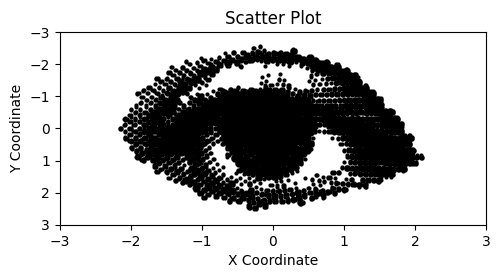


Shape of a batch of samples = torch.Size([40, 5000, 2])


In [11]:
# URL of the image to download and process
url = "https://www.shutterstock.com/image-vector/abstract-woman-eye-made-dots-600nw-184947926.jpg"

# Download and process the data
data = get_data(url, threshold=200, img_size=300)

# Visualize the processed data as a scatter plot
plot_data(data)

# Create a dataset and dataloader
dataset = PointsDataset(data, sample_size=5000)
dataloader = DataLoader(dataset, batch_size=40, shuffle=True, num_workers=1)

# Fetch a batch of samples from the DataLoader
samples = next(iter(dataloader))
print(f"\nShape of a batch of samples = {samples.shape}")

# Generate and display an animated GIF from the batch of samples
gif_data(samples, title="Sample ")

# Diffusion Model

## Noise schedule


In [3]:
def gen_schedule(T, beta1=1e-4, beta2=1e-2, mode=None, device='cpu'):
    """Generates a schedule of beta, alpha, and alpha_bar values over T timesteps.

    Args:
        T (int): The number of timesteps for the schedule.
        beta1 (float): The starting value of beta.
        beta2 (float): The ending value of beta.
        mode (str, optional): The mode of interpolation ('log' for logarithmic, 'sqrt' for square root).
                              If None, linear step is used.
        device (str, optional): The device ('cpu' or 'cuda') where the tensors will be allocated.

    Returns:
        tuple of torch.Tensor: beta, alpha, and alpha_bar tensors.
    """
    if mode == "log":
        beta = torch.exp(torch.linspace(start=math.log(beta1), end=math.log(beta2), steps=T, device=device))
    elif mode == "sqrt":
        beta = torch.linspace(start=beta1**0.5, end=beta2**0.5, steps=T, device=device)**2
    else:
        beta = torch.linspace(start=beta1, end=beta2, steps=T, device=device)

    alpha = 1 - beta
    alpha_bar = torch.cumprod(alpha, dim=-1)
    return beta, alpha, alpha_bar

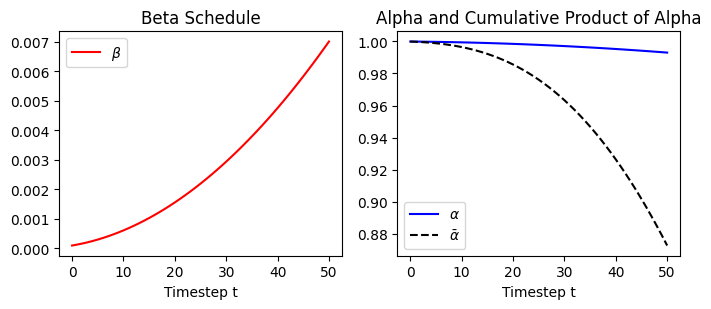

In [4]:
# Parameters for generating the schedule
beta_start = 1e-4
beta_end = 7e-3
T = 51

# Generate the schedule
beta, alpha, alpha_bar = gen_schedule(T, beta_start, beta_end, mode="sqrt", device='cpu')

# Visualization
plt.close()
fig, axs = plt.subplots(1, 2, figsize=(7, 3.2))
axs[0].set_title('Beta Schedule')
axs[1].set_title('Alpha and Cumulative Product of Alpha')

# Plotting the schedules
axs[0].plot(beta.detach().cpu(), color='red', label=r'$\beta$')
axs[1].plot(alpha.detach().cpu(), color='blue', label=r'$\alpha$')
axs[1].plot(alpha_bar.detach().cpu(), color='black', linestyle='--', label=r'$\bar{\alpha}$')

# Setting labels and legends
for ax in axs:
    ax.set_xlabel('Timestep t')
    ax.legend()

plt.tight_layout()
plt.show()

## Diffusion Step

In [5]:
def diffusion(x_0, t, alpha_bar, device='cpu'):
    """Simulates the diffusion process on an input tensor over a specified timestep.

    Args:
        x_0 (torch.Tensor): The initial tensor to undergo diffusion.
        t (int): The timestep of the diffusion process to simulate.
        alpha_bar (torch.Tensor): Cumulative product of alpha values for each timestep.
        device (str, optional): The device ('cpu' or 'cuda') where computations are performed.

    Returns:
        torch.Tensor: The diffused tensor at timestep t.
        torch.Tensor: The noise tensor used in the diffusion, returned if return_eps is True.
    """
    # Reshape alpha_bar_t to match the dimensions of x_0
    alpha_bar = alpha_bar.to(device)
    alpha_bar_t = alpha_bar[t].reshape(-1, 1, 1).to(device)

    # Generate random noise
    eps = torch.randn_like(x_0, device=device)

    # Calculate the diffused tensor
    x_t = torch.sqrt(alpha_bar_t) * x_0 + torch.sqrt(1 - alpha_bar_t) * eps

    # Return the diffused tensor and the noise tensor
    return x_t, eps

In [23]:
#@title Test diffusion function and visualization to optimze noise schedule

def test_diffusion():
    samples = next(iter(dataloader)).to(device)
    sample = samples[0]  # Extract a single sample for diffusion
    print(f"Sample shape: {sample.shape}")

    frames = []
    for t in range(0, T, 1):
        # For the initial timestep, use the original sample
        if t == 0:
            frames.append(sample.cpu())  # Move tensors back to CPU for plotting
        else:
            # Apply the diffusion process and add the resulting frame
            diffused_sample, _ = diffusion(sample, t, alpha_bar, device)
            frames.append(diffused_sample.cpu())

    # Visualize the diffusion process as an animated GIF
    return gif_data(frames, title="Diffused Sample at t = ")

test_diffusion()

Sample shape: torch.Size([5000, 2])


## Noise Model: U-Net
The core of our denoising framework is the U-Net model, designed to predict noise at various steps of the diffusion process. The U-Net architecture is chosen for its effectiveness in capturing both local features and global context, which is crucial for accurate noise prediction. Below, we define the U-Net model along with its configuration parameters.

In [6]:
class Embed(nn.Module):
    """
    A simple embedding layer that linearly transforms input from in_dim to out_dim,
    followed by a GELU activation function and another linear transformation.
    """
    def __init__(self, in_dim, out_dim):
        super(Embed, self).__init__()
        self.in_dim = in_dim
        self.layers = nn.Sequential(
            nn.Linear(in_dim, out_dim),
            nn.GELU(),
            nn.Linear(out_dim, out_dim))

    def forward(self, x):
        return self.layers(x.reshape(-1, self.in_dim))

class DoubleConv1(nn.Module):
    """
    A module that performs two consecutive convolution operations, each followed by
    batch normalization and GELU activation.
    """
    def __init__(self, in_dim, out_dim, kernel_size=10):
        super().__init__()
        self.double_conv = nn.Sequential(
            nn.Conv1d(in_dim, out_dim, kernel_size, padding=1),
            nn.BatchNorm1d(out_dim),
            nn.GELU(),
            nn.Conv1d(out_dim, out_dim, kernel_size, padding=1),
            nn.BatchNorm1d(out_dim),
            nn.GELU())

    def forward(self, x):
        return self.double_conv(x)

class ResConv1(nn.Module):
    """
    A residual convolutional module that optionally includes a residual connection.
    If in_dim and out_dim differ, a 1x1 convolution is applied to match dimensions.
    """
    def __init__(self, in_dim, out_dim, residual=True, kernel_size=3):
        super().__init__()
        self.residual = residual
        self.double_conv = DoubleConv1(in_dim, out_dim, kernel_size)

        if self.residual and in_dim != out_dim:
            self.reshape_conv = nn.Conv1d(in_dim, out_dim, kernel_size=1)

    def forward(self, x):
        identity = x

        out = self.double_conv(x)

        if self.residual:
            if hasattr(self, 'reshape_conv'):
                identity = self.reshape_conv(identity)
            out = (out + identity) / math.sqrt(2)  # Normalization factor for stabilizing the output

        return out

In [7]:
class Down(nn.Module):
    """
    A Down-sampling module that combines a DoubleConv1 block with MaxPooling.
    This module is designed to reduce the spatial dimensions of the input feature map,
    while increasing the representational complexity through consecutive convolutional operations.
    """
    def __init__(self, in_dim, out_dim, down_kernel=10):
        super().__init__()
        self.maxpool_conv = nn.Sequential(
            DoubleConv1(in_dim, out_dim, kernel_size=3),
            nn.MaxPool1d(down_kernel)
        )

    def forward(self, x):
        return self.maxpool_conv(x)

class Up(nn.Module):
    """
    An Up-sampling module that first uses ConvTranspose1d for spatial dimension expansion
    and then processes the result through a DoubleConv block. This module effectively
    combines high-level features learned at lower resolutions with high-resolution details
    through skip connections from corresponding Down-sampling modules.
    """
    def __init__(self, in_dim, out_dim, up_kernel=10):
        super(Up, self).__init__()
        self.up = nn.ConvTranspose1d(in_dim, out_dim, kernel_size=up_kernel, stride=up_kernel)
        self.double_cov = DoubleConv1(out_dim, out_dim, kernel_size=3)

    def forward(self, x, skip):
        # Concatenate input and skip connection
        x = torch.cat((x, skip), 1)

        # Up-sample
        x = self.up(x)

        # Process with DoubleConv
        x = self.double_cov(x)
        return x

class UNet(nn.Module):
    """A U-Net architecture for denoising, integrating timestep embeddings into the model.
    This model applies a series of Down-sampling and Up-sampling modules to process input data,
    incorporating temporal information at various stages to enhance the denoising capability.
    """
    def __init__(self, T, sample_size, n_coor=2, n_feat=8*4, kernel_size=10, verbose=False):
        super(UNet, self).__init__()
        self.sample_size = sample_size
        self.n_feat = n_feat
        self.n_coor = n_coor
        self.verbose = verbose

        n_groups = 8 # n_feat must be divisable by n_groups

        # Embedding layers for time embedding
        self.tembd1 = Embed(1, 1 * n_feat) # [B, 1] > [B, 1 * n_feat]
        self.tembd2 = Embed(1, 2 * n_feat) # [B, 1] > [B, 2 * n_feat]

        # Initial embedding from points to features
        # [B, 1000, 2] > [B, 2, 1000] > [B, n_feat, 1000]
        self.dembd = ResConv1(n_coor, n_feat, residual=True, kernel_size=3)

        # Down-sampling path
        self.down1 = Down(n_feat, 1 * n_feat, kernel_size) # [B, n_feat, 1000] > [B, n_feat, 100]
        self.down2 = Down(n_feat, 2 * n_feat, kernel_size) # [B, n_feat, 100] > [B, 2 * n_feat, 10]
        self.down3 = nn.Sequential(
            nn.AvgPool1d((sample_size//kernel_size//kernel_size)),
            nn.GELU()) # [B, 2 * n_feat, 10] > [B, 2 * n_feat, 1]

        # Up-sampling path
        self.up3 = nn.Sequential(
            nn.ConvTranspose1d(2 * n_feat, 2 * n_feat,
                               sample_size//kernel_size//kernel_size,
                               sample_size//kernel_size//kernel_size),
            nn.GroupNorm(n_groups, 2 * n_feat),
            nn.ReLU()) # [B,  2 * n_feat, 1] > [B,  2 * n_feat, 10]
        self.up2 = Up(2 * 2 * n_feat, n_feat, kernel_size) # 2 * [B, 2 * n_feat,  10] > [B, n_feat,  100]
        self.up1 = Up(2 * 1 * n_feat, n_feat, kernel_size) # 2 * [B, 1 * n_feat, 100] > [B, n_feat, 1000]

        # Final layer to produce estmated noise
        # 2 * [B, n_feat, 1000] > [B, 2, 1000]
        self.unembd = nn.Sequential(
            nn.Conv1d(2 * n_feat, n_feat, 3, padding=1),
            nn.GroupNorm(n_groups, n_feat),
            nn.ReLU(),
            nn.Conv1d(n_feat, n_coor, 3, padding=1))

    def forward(self, data, t):
        if self.verbose:
            print(f"\ndata.shape = {data.shape}")
        premuted = False

        # Ensure data is in the correct shape
        if (data.shape[1]==self.sample_size) & (data.shape[2]==self.n_coor):
            data = data.permute(0, 2, 1)
            premuted = True
            if self.verbose:
                print(f"data.shape = {data.shape}")

        # Embedding and down-sampling
        dembd = self.dembd(data)
        down1_output = self.down1(dembd)
        down2_output = self.down2(down1_output)
        down3_output = self.down3(down2_output)
        if self.verbose:
            print(f"\ndembd.shape = {dembd.shape}")
            print(f"dembd_down1.shape = {down1_output.shape}")
            print(f"dembd_down2.shape = {down2_output.shape}")
            print(f"dembd_down3.shape = {down3_output.shape}")

        # Time embeddings
        t_embd1 = self.tembd1(t).unsqueeze(-1)
        t_embd2 = self.tembd2(t).unsqueeze(-1)
        if self.verbose:
            print(f"\nt.shape = {t.shape}")
            print(f"t_embd1.shape = {t_embd1.shape}")
            print(f"t_embd2.shape = {t_embd2.shape}")

        # Up-sampling with skip connections and time embeddings
        up3_output = self.up3(down3_output)
        up2_output = self.up2(up3_output + t_embd2, skip=down2_output)
        up1_output = self.up1(up2_output + t_embd1, skip=down1_output)

        if self.verbose:
            print(f"\nup3_output.shape = {up3_output.shape}")
            print(f"up2_output.shape = {up2_output.shape}")
            print(f"up1_output.shape = {up1_output.shape}")

        # Final denoising output
        eps = self.unembd(torch.cat((up1_output, dembd), 1))
        if self.verbose:
            print(f"\neps.shape = {eps.shape}")

        if premuted:
            eps = eps.permute(0, 2, 1)
            if self.verbose:
                print(f"eps.shape = {eps.shape}")

        return eps

In [25]:
#@title Testing UNet and visualize estimated noise
def test_UNet():
    samples = next(iter(dataloader)).to(device)
    t = torch.randint(1, T, (samples.shape[0],), device=device)
    batch_t, eps = diffusion(samples, t, alpha_bar, device)
    noise_model = UNet(T, samples.shape[1], n_coor=samples.shape[2], n_feat=40, kernel_size=10, verbose=True).to(device)
    eps_hat = noise_model(batch_t, t/T)
    return gif_data(eps_hat, title="eps_hat for a random t ")

test_UNet()


data.shape = torch.Size([10, 5000, 2])
data.shape = torch.Size([10, 2, 5000])

dembd.shape = torch.Size([10, 40, 5000])
dembd_down1.shape = torch.Size([10, 40, 500])
dembd_down2.shape = torch.Size([10, 80, 50])
dembd_down3.shape = torch.Size([10, 80, 1])

t.shape = torch.Size([10])
t_embd1.shape = torch.Size([10, 40, 1])
t_embd2.shape = torch.Size([10, 80, 1])

up3_output.shape = torch.Size([10, 80, 50])
up2_output.shape = torch.Size([10, 40, 500])
up1_output.shape = torch.Size([10, 40, 5000])

eps.shape = torch.Size([10, 2, 5000])
eps.shape = torch.Size([10, 5000, 2])


## Generation

In [13]:
@torch.no_grad()
def generation_step(x_t, t, model, alpha, alpha_bar, T, device='cpu', verbose=False):
    """Performs a single generation step in the reverse diffusion process, moving from noisy data towards the original data distribution.

    Args:
        x_t (torch.Tensor): A noisy generated sample at timestep t.
        t (torch.Tensor): The current timestep in the reverse process.
        alpha (torch.Tensor): Precomputed alpha coefficients for the diffusion process.
        alpha_bar (torch.Tensor): Precomputed cumulative product of (1 - alpha) coefficients.
        T (int): Total number of timesteps in the diffusion process.
        model (torch.nn.Module, optional): Model to predict eps_hat if not provided.
        device (str, optional): Device for computation.

    Returns:
        torch.Tensor: The generated sample at timestep t-1.
        torch.Tensor: The estimated noise.
    """
    alpha = alpha.to(device)
    alpha_bar = alpha_bar.to(device)
    alpha_t = alpha[t].reshape(-1, 1, 1)
    beta_t = 1 - alpha_t
    alpha_bar_t = alpha_bar[t].reshape(-1, 1, 1)

    eps_hat = model(x_t, t/T)
    if verbose:
        print(f"eps_hat.shape = {eps_hat.shape}")
        print(f"x_t.shape = {x_t.shape}")
    mu_t = 1/torch.sqrt(alpha_t) * (x_t - beta_t/torch.sqrt(1-alpha_bar_t) * eps_hat)

    alpha_bar_before = alpha_bar
    alpha_bar_before[0] = 1 # to handel when t=0 and avoid adding noise

    alpha_bar_t_before = alpha_bar_before[t-1].reshape(-1, 1, 1).to(device)
    sigma_t = torch.sqrt(beta_t*(1 - alpha_bar_t_before)/(1 - alpha_bar_t))
    z = torch.randn_like(x_t, device=device)
    x_t_before = mu_t + sigma_t * z

    return x_t_before, eps_hat

@torch.no_grad()
def generation(model, alpha, alpha_bar, T, device='cpu', return_frames=True):
    """Generates samples through the reverse diffusion process, starting from noise.

    Args:
        model (torch.nn.Module): Model used for predicting noise at each step.
        alpha (torch.Tensor): Precomputed alpha coefficients for the diffusion process.
        alpha_bar (torch.Tensor): Precomputed cumulative product of (1 - alpha) coefficients.
        T (int): Total timesteps in the diffusion process.
        return_frames (bool, optional): Whether to return all intermediate frames from the generation process.

    Returns:
        torch.Tensor: The final generated sample.
        List[torch.Tensor] (optional): All intermediate frames, returned if return_frames is True.
    """
    x_t = torch.randn((1, model.sample_size, model.n_coor), device=device)

    if return_frames:
        frames = []
        frames.append(x_t)

    for i in range(T-1, 0, -1):
        t = torch.tensor([i]).to(device)
        x_t, _ = generation_step(x_t, t, model, alpha, alpha_bar, T, device)
        if return_frames:
            frames.append(x_t)

    if return_frames:
        return x_t, frames
    else:
        return x_t

In [14]:
#@title Test generation_step and generation functions
def test_genration_step():
    frames = []
    samples = next(iter(dataloader)).to(device)
    x_0 = samples[0]
    frames.append(x_0)

    t = torch.Tensor([1]).int().to(device)
    x_1, _ = diffusion(x_0, t, alpha_bar, device=device)
    frames.append(x_1)

    noise_model = UNet(T, sample_size=5000, n_coor=2, n_feat=8*5, kernel_size=10).to(device)
    x_0_hat, _ = generation_step(x_1, t, noise_model, alpha, alpha_bar, T, device)
    frames.append(x_0_hat)
    return gif_data(frames, idx_label=("x_0, t=0","x_1, t=1","x_0_hat from x_1"))

def test_generation():
    noise_model = UNet(T, sample_size=5000, n_coor=2, n_feat=8*5, kernel_size=10).to(device)
    _, frames = generation(noise_model, alpha, alpha_bar, T, device)
    return gif_data(frames)

test_genration_step()
test_generation()

## Training

In [15]:
# To save the trained model weights, ensure directory exists or create it
model_name = "model_eye.pth"
if not os.path.exists(output_dir):
    os.mkdir(output_dir)
model_abs_path = os.path.join(output_dir, model_name)

# Initialize dataset and dataloader for training
sample_size = 5000 # len(dataset)
batch_size = 10 # len(x_0)
dataset = PointsDataset(data, sample_size)
dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True, num_workers=1)

# Setup the noise model (U-Net) and move it to the appropriate device
noise_model = UNet(T, sample_size, n_coor=2, n_feat=8*5, kernel_size=10).to(device)

# Define the loss function and optimizer
criterion = nn.MSELoss()
optimizer = optim.AdamW(noise_model.parameters(), lr=1e-2)

# Specify the number of epochs for training
n_epoch = 6

In [62]:
# Training loop
total_start_time = time.time()

for epoch in range(n_epoch):
    epoch_start_time = time.time()
    epoch_sum_loss = 0.0
    pbar = tqdm(dataloader, desc=f"Epoch {epoch+1}/{n_epoch}")

    for x_0 in pbar:
        optimizer.zero_grad()
        x_0 = x_0.to(device)

        # Sample a random timestep for each sample in the batch
        t = torch.randint(1, T, (x_0.shape[0],), device=device)

        # Generate corrupted samples and corresponding actual noise at sampled timestep
        x_t, eps = diffusion(x_0, t, alpha_bar, device)

        # Predict the noise added to each sample using the noise model
        # _, eps_theta = generation_step(x_t, t, noise_model, alpha, alpha_bar, T, device)
        eps_theta = noise_model(x_t, t/T)

        # Compute the loss between the actual and predicted noise
        loss = criterion(eps, eps_theta)

        # Perform backpropagation and optimize the model
        loss.backward()
        optimizer.step()

        # Update the progress bar description with current batch loss
        pbar.set_description(
            f"Epoch {epoch+1}/{n_epoch}; "
            f"Batch Loss: {loss.item():.4f}")
        epoch_sum_loss += loss.item() * len(x_0) # multiply by batch_size to get the sum

    epoch_avg_loss = epoch_sum_loss / len(dataset)
    epoch_time = time.time() - epoch_start_time
    torch.save(noise_model.state_dict(), model_abs_path)

    # Print detailed metrics at the end of each epoch
    print(
        f"Epoch {epoch+1} completed in {epoch_time:.2f}s;",
        f"Epoch Loss: {epoch_avg_loss:.4f};",
        f"Updated {model_abs_path}")
    print("-"*80)

# Indicate training completion
total_time = time.time() - total_start_time
print(f'Finished Training in {total_time:.2f}s')
print(f'Final model saved at {model_abs_path}')

Epoch 1/6; Batch Loss: 0.8935: 100%|██████████| 500/500 [00:07<00:00, 69.47it/s]


Epoch 1 completed in 7.20s; Epoch Loss: 0.9051; Updated ./model_eye.pth
--------------------------------------------------------------------------------


Epoch 2/6; Batch Loss: 0.9020: 100%|██████████| 500/500 [00:06<00:00, 73.15it/s]


Epoch 2 completed in 6.84s; Epoch Loss: 0.9023; Updated ./model_eye.pth
--------------------------------------------------------------------------------


Epoch 3/6; Batch Loss: 0.9120: 100%|██████████| 500/500 [00:07<00:00, 71.07it/s]


Epoch 3 completed in 7.04s; Epoch Loss: 0.8993; Updated ./model_eye.pth
--------------------------------------------------------------------------------


Epoch 4/6; Batch Loss: 0.8798: 100%|██████████| 500/500 [00:07<00:00, 70.03it/s]


Epoch 4 completed in 7.14s; Epoch Loss: 0.9000; Updated ./model_eye.pth
--------------------------------------------------------------------------------


Epoch 5/6; Batch Loss: 0.8777: 100%|██████████| 500/500 [00:06<00:00, 73.63it/s]


Epoch 5 completed in 6.79s; Epoch Loss: 0.8996; Updated ./model_eye.pth
--------------------------------------------------------------------------------


Epoch 6/6; Batch Loss: 0.8794: 100%|██████████| 500/500 [00:07<00:00, 69.38it/s]


Epoch 6 completed in 7.21s; Epoch Loss: 0.8989; Updated ./model_eye.pth
--------------------------------------------------------------------------------
Finished Training in 42.32s
Final model saved at ./model_eye.pth


## Sample/Generation

In [16]:
model_abs_path = os.path.join(output_dir, "model_eye (2).pth")

if noise_model is None:
    noise_model = UNet(T, sample_size, n_coor=2, n_feat=8*5, kernel_size=10).to(device)

noise_model.load_state_dict(torch.load(model_abs_path, map_location=device))
noise_model.eval()
print("Loaded ", model_abs_path)

Loaded  ./model_eye (2).pth


In [64]:
gif_abs_path = os.path.join(output_dir, "model_eye.gif")
x_0_hat, frames = generation(noise_model, alpha, alpha_bar, T, device)
gif_data(frames, title="Generation t=", save=True, gif_abs_path=gif_abs_path)

Saved GIF at ./model_eye.gif


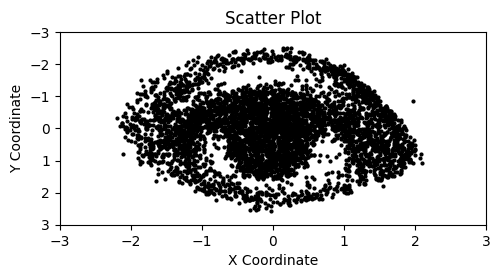

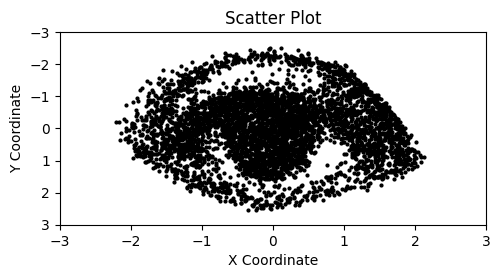

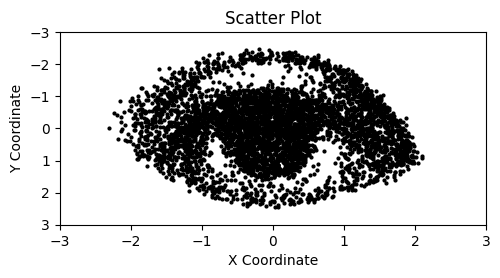

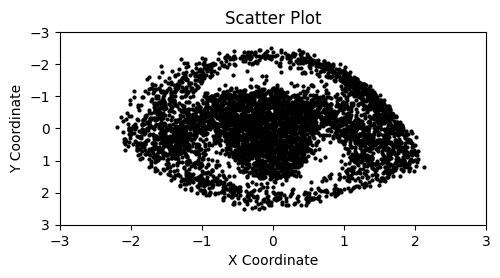

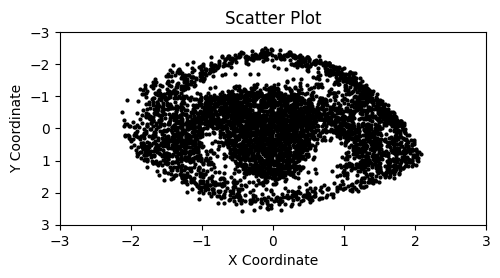

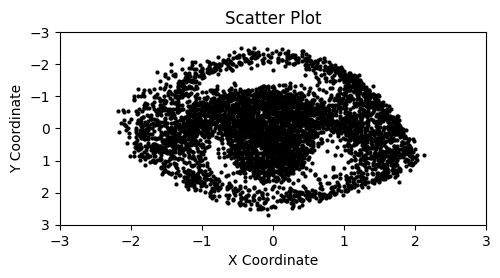

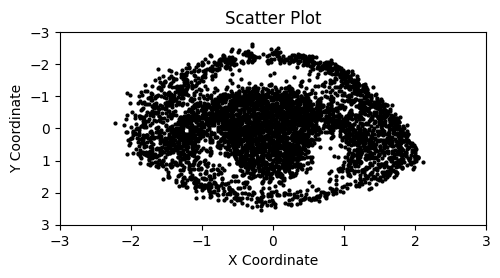

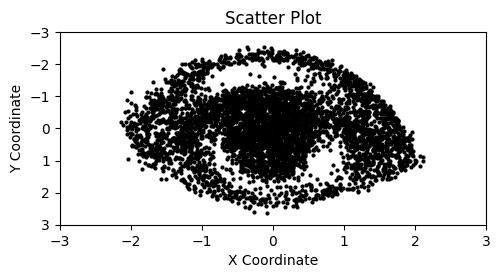

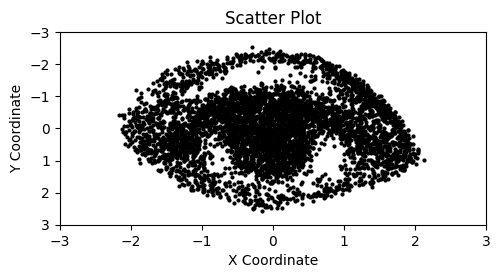

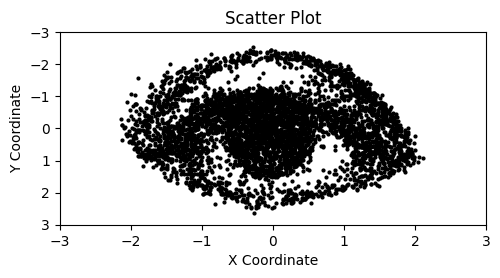

In [28]:
# samples = []
for i in range(10):
    # samples.append(generation(noise_model, alpha, alpha_bar, T, device, return_frames=False))
    # gif_data(samples, title="Sample #")
    sample = generation(noise_model, alpha, alpha_bar, T, device, return_frames=False)
    plot_data(sample)

In [26]:
sample.shape

torch.Size([1, 5000, 2])

In [66]:
files.download(model_abs_path)
files.download(gif_abs_path)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>